In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset, random_split
import tifffile as tiff
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from PIL import Image

# Custom Dataset Loader for Unlabeled TIFF Images
class UnlabeledTIFFDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = [os.path.join(root_dir, fname) for fname in os.listdir(root_dir) if fname.lower().endswith(('tif', 'tiff'))]

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        try:
            image = tiff.imread(img_path).astype(np.float32)   
            image = image * 240
            image[image > 254] = 254
            if image.ndim == 3:
                image = image[0]
            
        except Exception as e:
            print(f"Warning: Skipping unreadable image {img_path} - {e}")
            return self.__getitem__((idx + 1) % len(self.image_paths))

        image = image/255

        if self.transform:
            image = self.transform(image)

        image = torch.tensor(image, dtype=torch.float32).unsqueeze(0)
        image = image.squeeze(1)
        return image, 0



In [ ]:
import torch
import numpy as np
from tqdm import tqdm
from torchvision import transforms
from skimage import io
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from torch.utils.tensorboard import SummaryWriter
import torchvision
import io as sysio
from PIL import Image


class AE(torch.nn.Module):
    def __init__(self, latent_dim=8):
        super(AE, self).__init__()
        self.encoder = torch.nn.Sequential(
            torch.nn.Conv2d(1, 32, 3, stride=2, padding=1),  # 32 -> 16
            torch.nn.BatchNorm2d(32),
            torch.nn.ReLU(),
            torch.nn.Conv2d(32, 64, 3, stride=2, padding=1),  # 16 -> 8
            torch.nn.BatchNorm2d(64),
            torch.nn.ReLU(),
            torch.nn.Conv2d(64, 128, 3, stride=2, padding=1),  # 8 -> 4
            torch.nn.BatchNorm2d(128),
            torch.nn.ReLU(),
            torch.nn.Flatten()
        )
        self.encoder_fc = torch.nn.Sequential(
            torch.nn.Linear(128 * 4 * 4, 1024),
            torch.nn.LeakyReLU(0.01),
            torch.nn.Dropout(p=0.3),
            torch.nn.Linear(1024, latent_dim)
        )

        self.decoder_fc = torch.nn.Sequential(
            torch.nn.Linear(latent_dim, 1024),
            torch.nn.LeakyReLU(0.01),
            torch.nn.Dropout(p=0.3),
            torch.nn.Linear(1024, 128 * 4 * 4)
        )

        self.decoder = torch.nn.Sequential(
            torch.nn.ConvTranspose2d(128, 64, 3, stride=2, padding=1, output_padding=1),  # 4 -> 8
            torch.nn.BatchNorm2d(64),
            torch.nn.LeakyReLU(0.01),
            torch.nn.ConvTranspose2d(64, 32, 3, stride=2, padding=1, output_padding=1),  # 8 -> 16
            torch.nn.BatchNorm2d(32),
            torch.nn.LeakyReLU(0.01),
            torch.nn.ConvTranspose2d(32, 1, 3, stride=2, padding=1, output_padding=1),   # 16 -> 32
            torch.nn.Sigmoid()
        )

    def encode(self, x):
        x = self.encoder(x)
        return self.encoder_fc(x)

    def decode(self, z):
        x = self.decoder_fc(z).view(-1, 128, 4, 4)
        return self.decoder(x)

    def forward(self, x):
        z = self.encode(x)
        return self.decode(z), z

def plot_reconstruction_progress(model, dataloader, device, epoch):
    """Plot original vs reconstructed images during training"""
    model.eval()
    with torch.no_grad():
        for x, _ in dataloader:
            x = x.to(device)
            recon, _ = model(x)
            break  # only one batch

    x = x.cpu()
    recon = recon.cpu()

    print(f"Reconstruction stats — min: {recon.min().item():.4f}, max: {recon.max().item():.4f}, mean: {recon.mean().item():.4f}, std: {recon.std().item():.4f}")

    n = min(8, x.size(0))
    fig, axes = plt.subplots(2, n, figsize=(n * 2, 4))
    for i in range(n):
        axes[0, i].imshow(x[i].squeeze(), cmap="gray", vmin=0, vmax=1)
        axes[0, i].axis("off")
        axes[1, i].imshow(recon[i].squeeze(), cmap="gray", vmin=0, vmax=1)
        axes[1, i].axis("off")
    plt.suptitle(f"Reconstruction at Epoch {epoch}")
    plt.tight_layout()
    plt.show()


def ae_loss_function(recon_x, x, z, alpha=0.01, writer=None, epoch=None):
    recon_loss = torch.nn.functional.mse_loss(recon_x, x)
    latent_var = z.var(dim=0).mean()
    total_loss = recon_loss - alpha * latent_var

    if writer is not None and epoch is not None:
        writer.add_scalar("Loss/total", total_loss.item(), epoch)
        writer.add_scalar("Loss/reconstruction", recon_loss.item(), epoch)
        writer.add_scalar("Latent/variance", latent_var.item(), epoch)

    return total_loss


In [ ]:

# Step 2: Train Autoencoder and Extract Latent Representations
import torch.optim as optim
from torch.utils.data import DataLoader, random_split

def train_ae(model, train_loader, val_loader, epochs=500, lr=1e-4):
    optimizer = optim.Adam(model.parameters(), lr=lr)
    train_losses, val_losses = [], []
    writer = SummaryWriter(log_dir="runs/ae_experiment")

    for epoch in range(epochs):
        model.train()
        train_loss = 0.0
        for x, _ in train_loader:
            x = x.to(device)
            recon, z = model(x)
            loss = ae_loss_function(recon, x, z, alpha=0.01, writer=writer, epoch=epoch)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
        train_loss /= len(train_loader)
        train_losses.append(train_loss)
        writer.add_scalar("Loss/train_epoch_avg", train_loss, epoch)

        model.eval()
        val_loss = 0.0
        latent_all = []
        with torch.no_grad():
            for x, _ in val_loader:
                x = x.to(device)
                recon, z = model(x)
                loss = ae_loss_function(recon, x, z, alpha=0.01)
                val_loss += loss.item()
                latent_all.append(z.cpu())
        val_loss /= len(val_loader)
        val_losses.append(val_loss)
        writer.add_scalar("Loss/val_epoch_avg", val_loss, epoch)

        # Add reconstruction image grid to TensorBoard
        if (epoch + 1) % 100 == 0:
            plot_reconstruction_progress(model, val_loader, device, epoch + 1)
            grid = torchvision.utils.make_grid(torch.cat([x[:8].cpu(), recon[:8].cpu()]), nrow=8, normalize=True)
            writer.add_image("Reconstruction/ImageGrid", grid, epoch)

            # t-SNE visualization of latent space
            z_all = torch.cat(latent_all, dim=0).numpy()
            tsne = TSNE(n_components=2, random_state=42)
            z_2d = tsne.fit_transform(z_all)
            fig, ax = plt.subplots()
            ax.scatter(z_2d[:, 0], z_2d[:, 1], s=3, alpha=0.6)
            ax.set_title(f"t-SNE of Latents at Epoch {epoch+1}")
            buf = sysio.BytesIO()
            plt.savefig(buf, format='png')
            buf.seek(0)
            image = Image.open(buf)
            image = transforms.ToTensor()(image)
            writer.add_image("Latent/t-SNE", image, epoch)
            plt.close()

    writer.close()

    # Plot training and validation loss
    plt.plot(range(epochs), train_losses, label='Train Loss')
    plt.plot(range(epochs), val_losses, label='Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.title('Training vs Validation Loss')
    plt.show()

    return model



In [4]:
# !tensorboard --logdir=runs




/tmp/ipykernel_1296262/93189856.py:42: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32).unsqueeze(0)


Reconstruction stats — min: 0.0000, max: 1.0000, mean: 0.3106, std: 0.1403


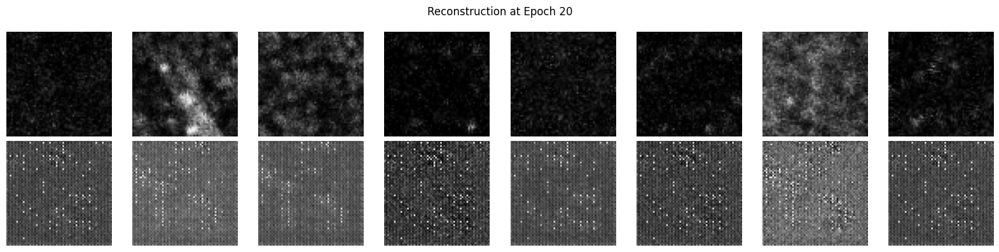

/tmp/ipykernel_1296262/93189856.py:42: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32).unsqueeze(0)


Reconstruction stats — min: 0.0000, max: 1.0000, mean: 0.2565, std: 0.1017


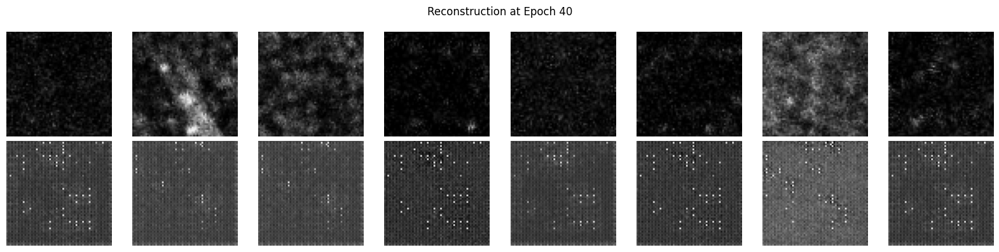

/tmp/ipykernel_1296262/93189856.py:42: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32).unsqueeze(0)


Reconstruction stats — min: 0.0000, max: 1.0000, mean: 0.2360, std: 0.0924


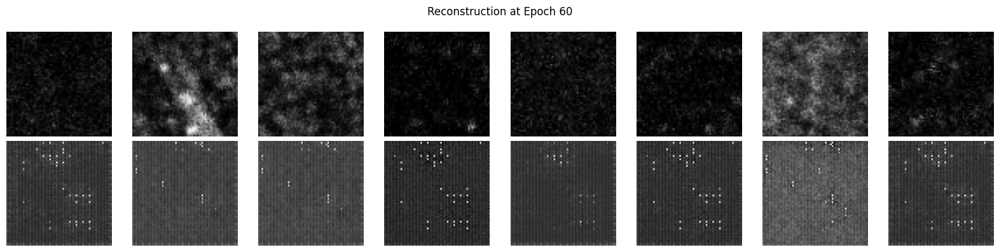

/tmp/ipykernel_1296262/93189856.py:42: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32).unsqueeze(0)


Reconstruction stats — min: 0.0000, max: 1.0000, mean: 0.2104, std: 0.0845


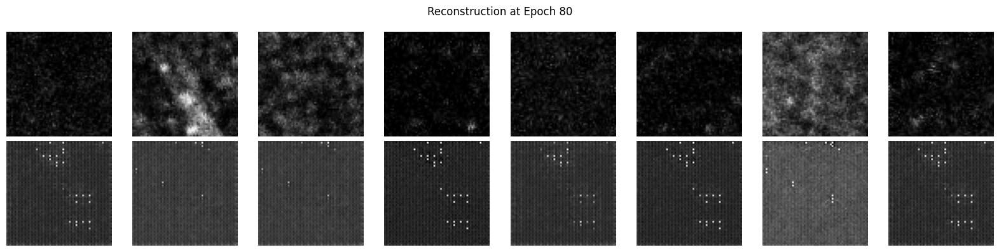

/tmp/ipykernel_1296262/93189856.py:42: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32).unsqueeze(0)


Reconstruction stats — min: 0.0000, max: 1.0000, mean: 0.1998, std: 0.0753


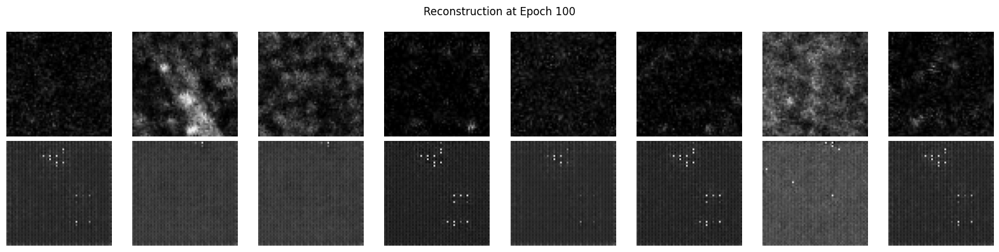

/tmp/ipykernel_1296262/93189856.py:42: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32).unsqueeze(0)


Reconstruction stats — min: 0.0000, max: 1.0000, mean: 0.1873, std: 0.0715


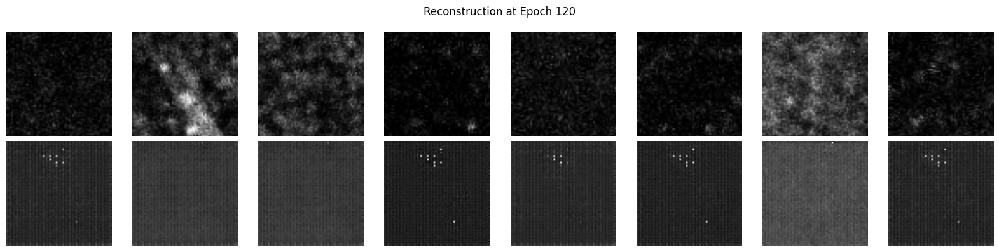

/tmp/ipykernel_1296262/93189856.py:42: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32).unsqueeze(0)


Reconstruction stats — min: 0.0000, max: 1.0000, mean: 0.1759, std: 0.0698


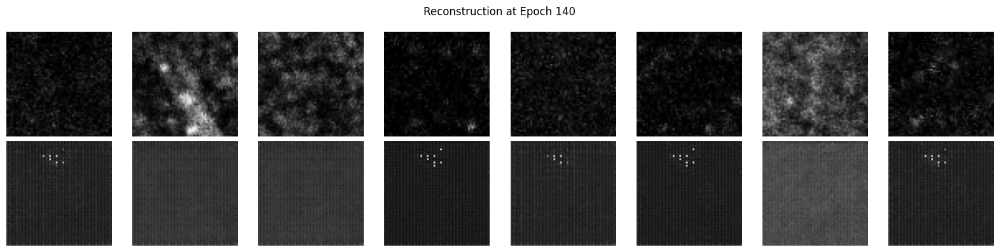

/tmp/ipykernel_1296262/93189856.py:42: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32).unsqueeze(0)


Reconstruction stats — min: 0.0000, max: 1.0000, mean: 0.1690, std: 0.0716


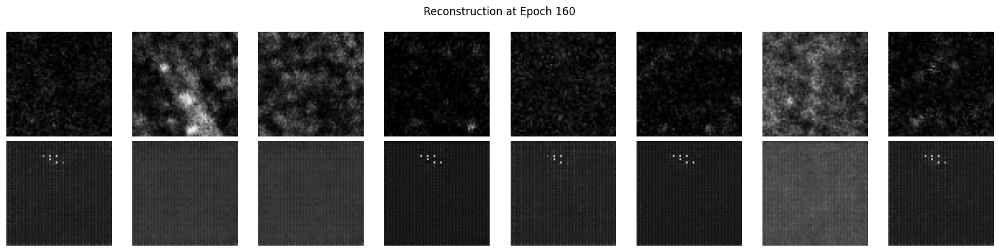

/tmp/ipykernel_1296262/93189856.py:42: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32).unsqueeze(0)


Reconstruction stats — min: 0.0000, max: 1.0000, mean: 0.1623, std: 0.0616


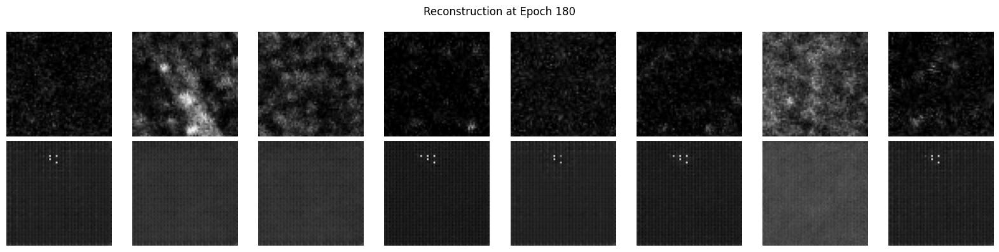

/tmp/ipykernel_1296262/93189856.py:42: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32).unsqueeze(0)


Reconstruction stats — min: 0.0000, max: 1.0000, mean: 0.1506, std: 0.0671


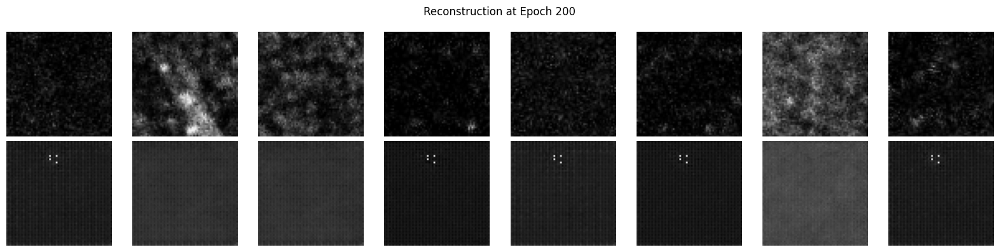

/tmp/ipykernel_1296262/93189856.py:42: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32).unsqueeze(0)


Reconstruction stats — min: 0.0000, max: 1.0000, mean: 0.1481, std: 0.0760


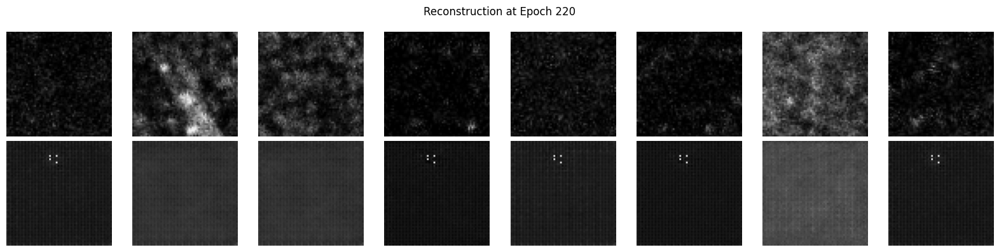

/tmp/ipykernel_1296262/93189856.py:42: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32).unsqueeze(0)


Reconstruction stats — min: 0.0000, max: 1.0000, mean: 0.1453, std: 0.0695


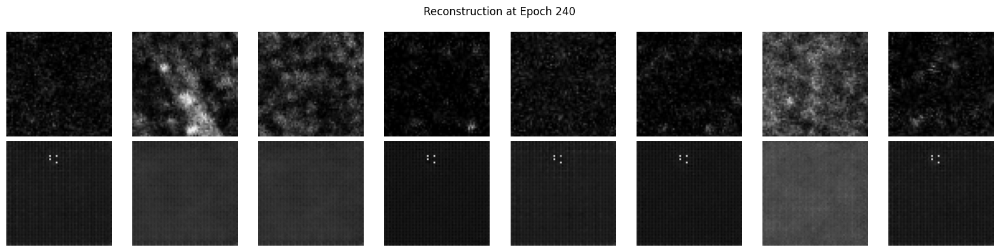

/tmp/ipykernel_1296262/93189856.py:42: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32).unsqueeze(0)


Reconstruction stats — min: 0.0000, max: 1.0000, mean: 0.1381, std: 0.0703


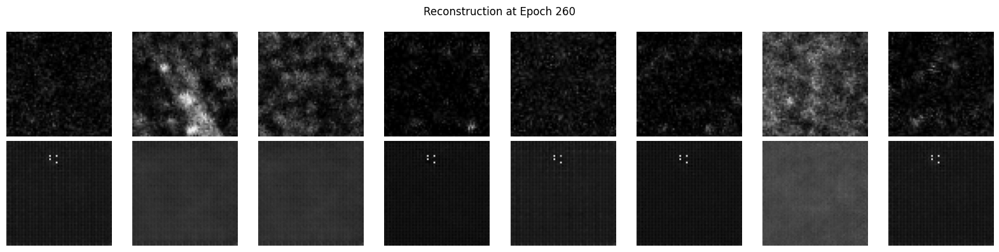

/tmp/ipykernel_1296262/93189856.py:42: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32).unsqueeze(0)


Reconstruction stats — min: 0.0000, max: 1.0000, mean: 0.1321, std: 0.0666


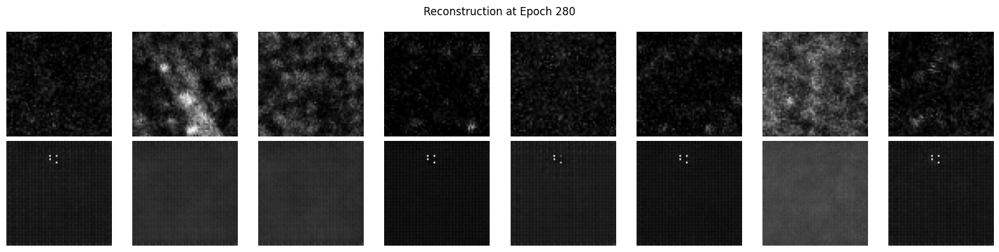

/tmp/ipykernel_1296262/93189856.py:42: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32).unsqueeze(0)


Reconstruction stats — min: 0.0000, max: 1.0000, mean: 0.1295, std: 0.0679


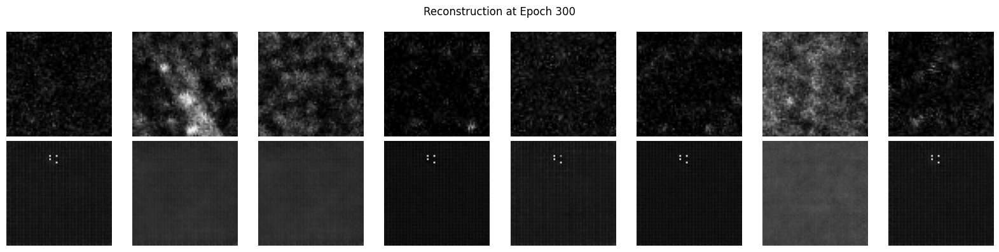

/tmp/ipykernel_1296262/93189856.py:42: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32).unsqueeze(0)


Reconstruction stats — min: 0.0000, max: 1.0000, mean: 0.1313, std: 0.0684


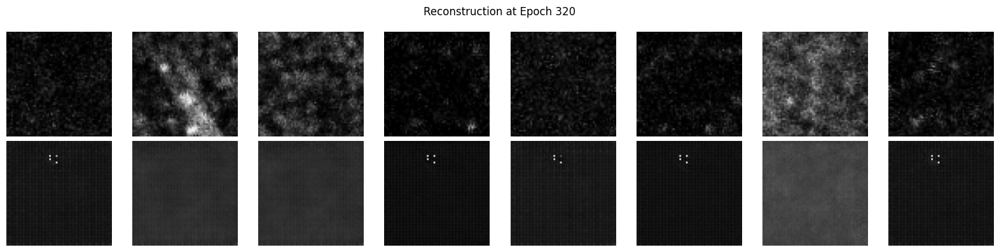

/tmp/ipykernel_1296262/93189856.py:42: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32).unsqueeze(0)


Reconstruction stats — min: 0.0000, max: 1.0000, mean: 0.1212, std: 0.0700


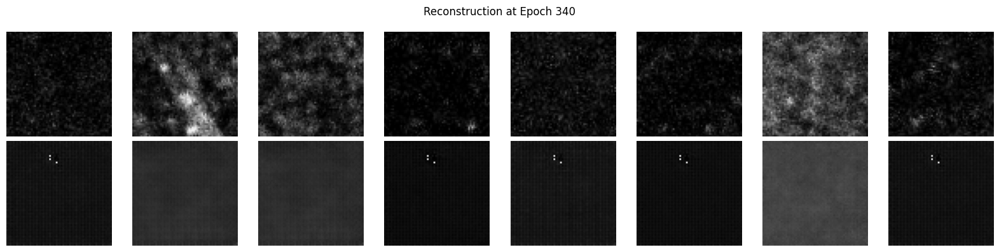

/tmp/ipykernel_1296262/93189856.py:42: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32).unsqueeze(0)


Reconstruction stats — min: 0.0000, max: 1.0000, mean: 0.1296, std: 0.0665


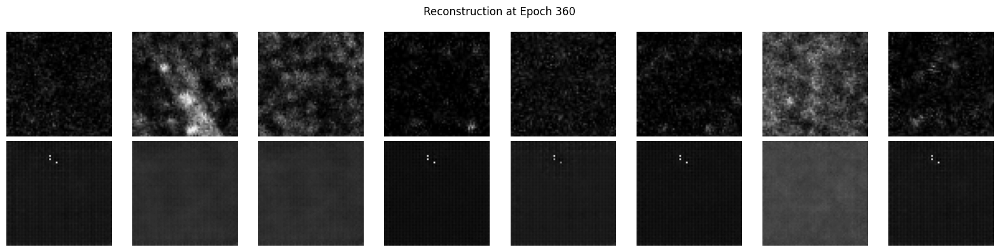

/tmp/ipykernel_1296262/93189856.py:42: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32).unsqueeze(0)


Reconstruction stats — min: 0.0000, max: 1.0000, mean: 0.1245, std: 0.0677


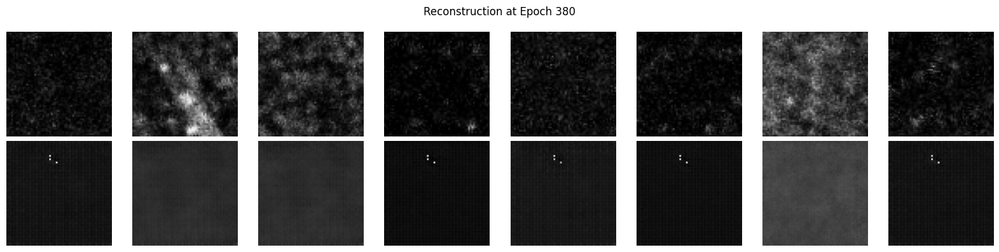

/tmp/ipykernel_1296262/93189856.py:42: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32).unsqueeze(0)


Reconstruction stats — min: 0.0000, max: 1.0000, mean: 0.1255, std: 0.0758


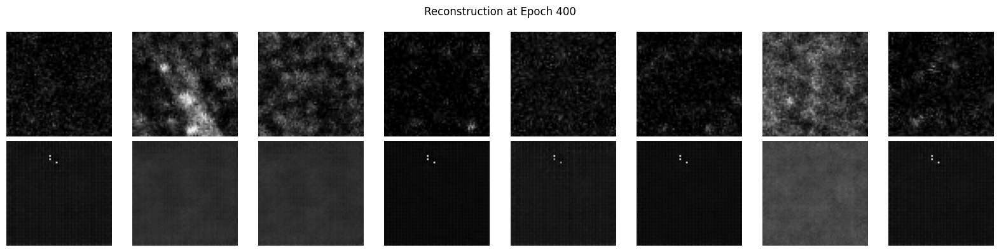

/tmp/ipykernel_1296262/93189856.py:42: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32).unsqueeze(0)


Reconstruction stats — min: 0.0000, max: 1.0000, mean: 0.1254, std: 0.0683


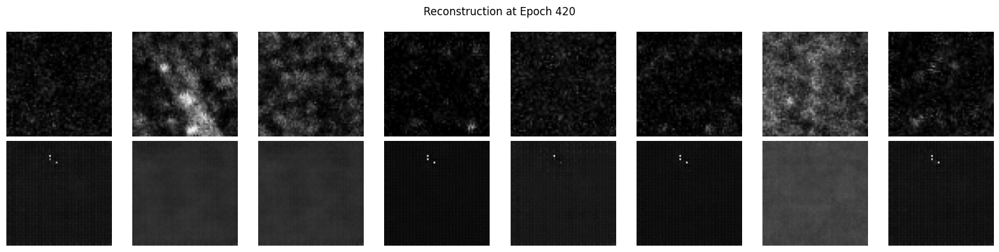

/tmp/ipykernel_1296262/93189856.py:42: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32).unsqueeze(0)


Reconstruction stats — min: 0.0000, max: 1.0000, mean: 0.1253, std: 0.0687


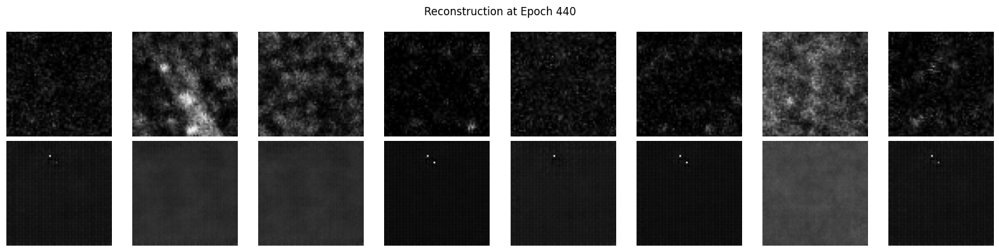

/tmp/ipykernel_1296262/93189856.py:42: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32).unsqueeze(0)


Reconstruction stats — min: 0.0000, max: 1.0000, mean: 0.1160, std: 0.0688


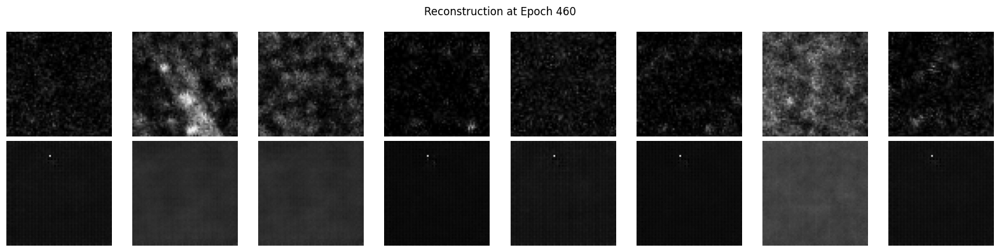

/tmp/ipykernel_1296262/93189856.py:42: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32).unsqueeze(0)


Reconstruction stats — min: 0.0000, max: 1.0000, mean: 0.1199, std: 0.0691


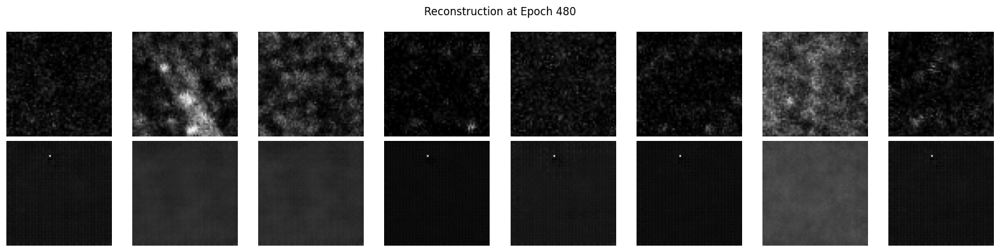

/tmp/ipykernel_1296262/93189856.py:42: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image = torch.tensor(image, dtype=torch.float32).unsqueeze(0)


Reconstruction stats — min: 0.0000, max: 1.0000, mean: 0.1155, std: 0.0672


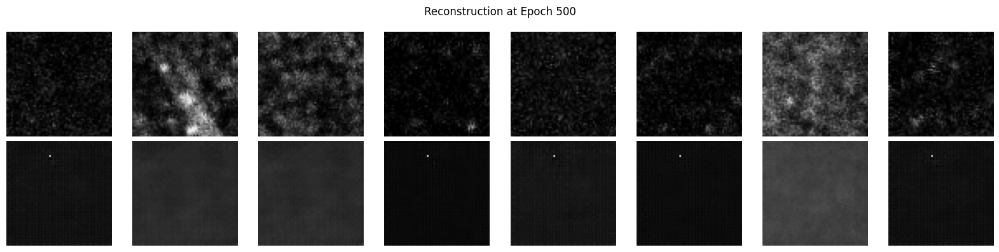

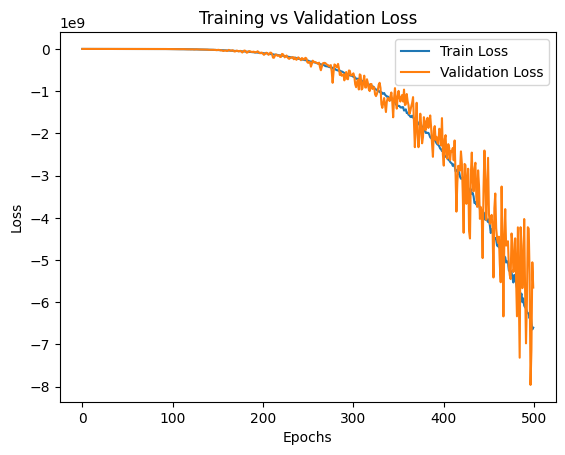

In [ ]:

# Load Data
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
data_dir = '/mnt/d/lding/FA/analysis_results/FA_ML_Annabel_20250217/031125/ctrl_ch1_major/patches32_40p_20250506-2128-0507-1001'

transform = transforms.Compose([    
    transforms.ToTensor()
])
dataset = UnlabeledTIFFDataset(root_dir=data_dir, transform=transform)

# Split dataset into training and validation sets
train_size = int(0.8 * len(dataset))
val_size = len(dataset) - train_size
train_dataset, val_dataset = random_split(dataset, [train_size, val_size])
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=128, shuffle=False)

# Train AE
ae = AE().to(device)
ae = train_ae(ae, train_loader, val_loader)

In [ ]:
import torch
import numpy as np
from tqdm import tqdm
from torchvision import transforms
from skimage import io
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE

# Step 3: Cluster in Latent Space

def cluster_latents(model, dataloader, num_clusters=4):
    model.eval()
    latents = []
    images = []
    with torch.no_grad():
        for x, _ in dataloader:
            x = x.to(device)
            _, z = model(x)
            latents.append(z.cpu().numpy())
            images.append(x.cpu())
    latents = np.concatenate(latents, axis=0)
    images = torch.cat(images, dim=0)

    kmeans = KMeans(n_clusters=num_clusters, random_state=0).fit(latents)
    labels = kmeans.labels_
    return latents, labels, images

# Step 4: Visualize Clusters with t-SNE and Reconstructed Images

def visualize_clusters(latents, labels, images, model):
    tsne = TSNE(n_components=2, perplexity=30, random_state=42)
    latents_2d = tsne.fit_transform(latents)

    plt.figure(figsize=(8, 6))
    plt.scatter(latents_2d[:, 0], latents_2d[:, 1], c=labels, cmap='tab10', alpha=0.7, s=0.5)
    plt.xlabel("t-SNE Dimension 1")
    plt.ylabel("t-SNE Dimension 2")
    plt.title("2D Visualization of Latent Space using t-SNE")
    plt.show()

    selected_images = []
    selected_labels = set()
    for i, label in enumerate(labels):
        if label not in selected_labels:
            selected_labels.add(label)
            selected_images.append(images[i])
        if len(selected_labels) == 4:
            break

    selected_images = torch.stack(selected_images).to(device)
    reconstructed, _ = model(selected_images)

    fig, axes = plt.subplots(2, len(selected_images), figsize=(15, 5))
    for i in range(len(selected_images)):
        axes[0, i].imshow(selected_images[i].squeeze().cpu(), cmap='gray', vmax=1.0, vmin=0)
        axes[1, i].imshow(reconstructed[i].squeeze().cpu().detach(), cmap='gray', vmax=1.0, vmin=0)
        axes[0, i].axis('off')
        axes[1, i].axis('off')
    plt.show()


In [ ]:
import torch
import numpy as np
from tqdm import tqdm
from torchvision import transforms
from skimage import io
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE


# Step 5: Show multiple decoded images per cluster

def cluster_and_display_images(latents, labels, images, model, num_samples_per_cluster=10):
    unique_labels = np.unique(labels)
    fig, axes = plt.subplots(len(unique_labels)*2, num_samples_per_cluster, figsize=(num_samples_per_cluster*1.5, len(unique_labels)*2))

    for cluster_idx, cluster_label in enumerate(unique_labels):
        cluster_indices = np.where(labels == cluster_label)[0][:num_samples_per_cluster]
        cluster_images = images[cluster_indices].to(device)
        recon_images, _ = model(cluster_images)

        for i in range(num_samples_per_cluster):
            axes[2 * cluster_idx, i].imshow(cluster_images[i].squeeze().cpu(), cmap='gray', vmin=0, vmax=1.0)
            axes[2 * cluster_idx + 1, i].imshow(recon_images[i].squeeze().cpu().detach(), cmap='gray', vmin=0, vmax=1.0)
            axes[2 * cluster_idx, i].axis('off')
            axes[2 * cluster_idx + 1, i].axis('off')

    plt.tight_layout()
    plt.show()


In [ ]:
latents, labels, images = cluster_latents(ae, train_loader, num_clusters=4)


In [ ]:
visualize_clusters(latents, labels, images, ae)


In [ ]:
cluster_and_display_images(latents, labels, images, ae, num_samples_per_cluster=10)
